#**Importing Necessary Libraries and Data Exploration**

**Importing Necessary Libraries**<br>
Importing Libraries:-<br>
Each of these plays a role in creating, evaluating, and visualizing machine learning models.

1. **TensorFlow (tf) & Keras**:
   - TensorFlow: A popular open-source framework for building and training machine learning models.
   - Keras: A high-level API within TensorFlow for building neural networks easily.

2. **os**:
   - Provides functionalities to interact with the operating system, like file and directory management.

3. **cv2**:
   - From the OpenCV library, used for image processing tasks like reading, manipulating, and displaying images.

4. **matplotlib.pyplot (plt)**:
   - A plotting library for creating visualizations like graphs, charts, and plots.

5. **numpy (np)**:
   - A library for numerical computing, especially useful for handling arrays and performing matrix operations.

6. **imghdr**:
   - Used to determine the type of image file (e.g., JPEG, PNG).

7. **TensorFlow Keras Metrics**:
   - Precision, Recall, BinaryAccuracy: Evaluate and measure the performance of your machine learning models.

8. **TensorFlow Keras Datasets, Layers, Models**:
   - Datasets: Prebuilt datasets for training models.
   - Layers: Building blocks of neural networks (e.g., dense, convolutional layers).
   - Models: Frameworks for creating and managing neural network architectures.

9. **sklearn.metrics**:
   - Confusion Matrix, Classification Report, Accuracy Score: Tools for evaluating the performance of models (precision, recall, F1 score, etc.).

10. **warnings**:
    - Used to suppress or handle warning messages in Python scripts.


In [ ]:
import tensorflow as tf,keras
import os
import cv2
from matplotlib import pyplot as plt
import numpy as np
import imghdr

from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy
from tensorflow.keras import datasets,layers,models
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

import warnings
warnings.filterwarnings('ignore')

<ipython-input-1-71829bf0123e>:6: DeprecationWarning: 'imghdr' is deprecated and slated for removal in Python 3.13
  import imghdr


**Unziping / Opening the Image Dataset**





In [ ]:
#from the NewData Dataset
!unzip NewGarbageDataSet.zip
%ls

Archive:  NewGarbageDataSet.zip
   creating: Data/Battery/
  inflating: Data/Battery/360_F_319512685_63GEqom3zgl15eTV97QSrqL8i28D3XJ0.jpg  
  inflating: Data/Battery/507615_gettyimages578663071_452701_crop.jpg  
  inflating: Data/Battery/715oqKNOi7L.jpg  
  inflating: Data/Battery/9V-Original-HW-High-Quality-Battery-1.jpg  
  inflating: Data/Battery/Batteries-.jpg  
  inflating: Data/Battery/Batteries2.jpg  
  inflating: Data/Battery/Battery-waste-disposal-in-India.jpg  
  inflating: Data/Battery/C-Size-Battery_Duracell.jpg.txt  
  inflating: Data/Battery/delhi-india-many-sorts-discarded-600w-1464771824.jpg  
  inflating: Data/Battery/download (4).jpeg  
  inflating: Data/Battery/download.jpeg  
  inflating: Data/Battery/image (1).jpeg  
 extracting: Data/Battery/image (1).png  
  inflating: Data/Battery/image (10).jpeg  
  inflating: Data/Battery/image (11).jpeg  
  inflating: Data/Battery/image (12).jpeg  
  inflating: Data/Battery/image (13).jpeg  
  inflating: Data/Battery/image (1

**Displaying the Classes in the Image Dataset**

In [ ]:
data_dir="Data"
os.listdir(data_dir)

['Cardboard', 'Battery', 'Plastic', 'Food', 'Paper', 'Metal']

**Deleating Images that dont have the Specified Extentions**

In [ ]:
image_exts=['jpeg','jpg','bmp','png']
for image_class in os.listdir(data_dir):
  for image in os.listdir(os.path.join(data_dir,image_class)):
    image_path=os.path.join(data_dir,image_class,image)
    try:
      img=cv2.imread(image_path)
      tip=imghdr.what(image_path)
      if tip not in image_exts:
        print('Image not in ext list {}'.format(image_path))
        os.remove(image_path)
    except Exception as e:
      print('Issue with image {}'.format(image_path))

**Image Inspection / Checking if the Image from a Class is being Uploaded Correctly / Not**<br>
To confirm that the image has been loaded properly and verify its content
<br>

> When using , OpenCV reads the image in BGR format (Blue-Green-Red) by default, whereas Matplotlib's  expects images in RGB format (Red-Green-Blue). As a result, the colors may appear inverted (e.g., reds may look blue, and so on).

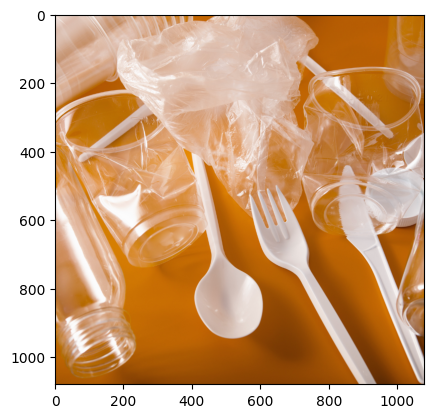

In [ ]:
img=cv2.imread(os.path.join(data_dir,'Plastic','/content/Data/Plastic/11.png'))
plt.imshow(img)

**Visualizing an image with correct color formatting**<br>
**Why Is the Conversion Necessary?**
- OpenCV reads images in BGR format (Blue-Green-Red), but Matplotlib visualizes images in RGB format (Red-Green-Blue). Without the conversion, colors in the image would appear wrong (e.g., red might look blue).

**Functionality**:
1. Fixes the color mismatches caused by different library defaults (OpenCV vs. Matplotlib).
2. Visualizes the corrected image for inspection or debugging purposes.



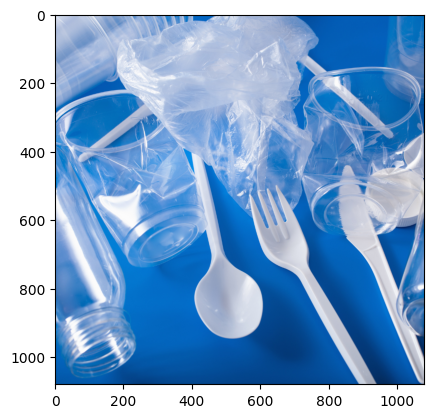

In [ ]:
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
# above reorders the channels
plt.show()

# **Data Exploration and Manipulation**

The function **tf.keras.utils.image_dataset_from_directory** is used to create a dataset of image data from a directory. This is particularly useful for training neural networks in TensorFlow. Here's what the code data = tf.keras.utils.image_dataset_from_directory("Garbage/Data") does:
<br>
* The function image_dataset_from_directory scans the specified directory, identifies the subdirectories, and automatically labels the images based on the subdirectory names.
<br>
* It creates a tf.data.Dataset object, which is a format optimized for training neural networks.

**Loading and Preprocessing Images:**<br>
It loads the images from the directory, resizes them to a default size (256x256 by default), and decodes them into tensors.

In [ ]:
data = tf.keras.utils.image_dataset_from_directory("Data")

Found 1104 files belonging to 6 classes.


**Convert a TensorFlow Dataset object into a NumPy iterator for easier manipulation and iteration**

In [ ]:
data_i=data.as_numpy_iterator()

**Visualize image data from a dataset and display it with corresponding labels.**

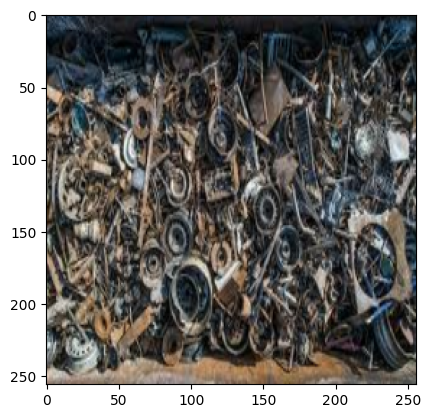

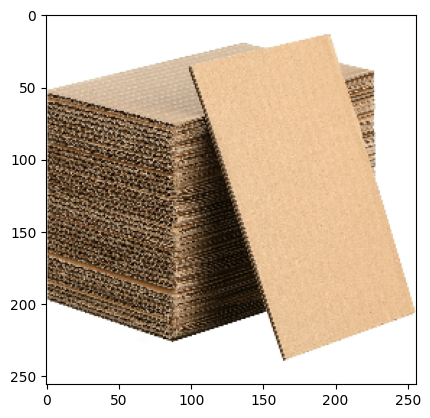

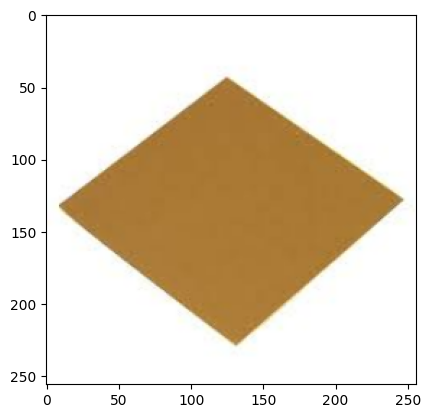

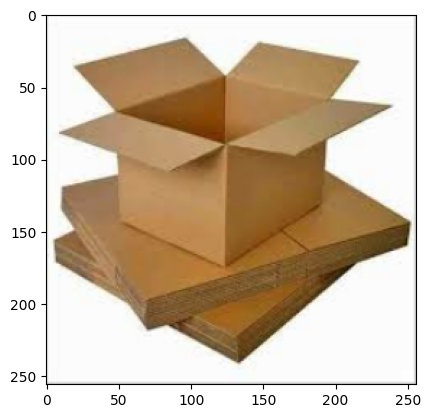

[3 1 1 1 2 2 5 4 1 5 0 4 1 2 4 4 0 1 4 2 1 4 5 1 4 5 4 1 1 4 4 2]


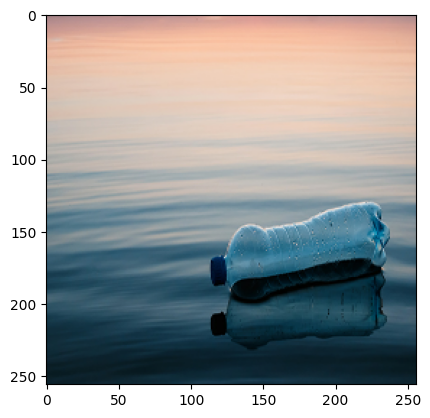

[5 5 2 3 1 5 5 0 3 5 3 0 4 1 2 2 1 2 3 4 4 5 2 2 5 0 0 5 5 2 1 5]


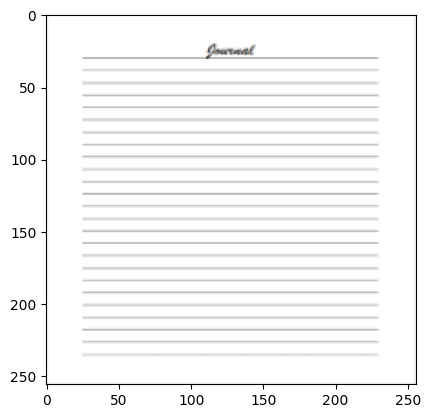

[4 3 2 1 3 5 3 1 3 5 0 1 1 1 1 4 5 2 2 4 1 5 1 0 5 4 4 4 3 1 0 5]


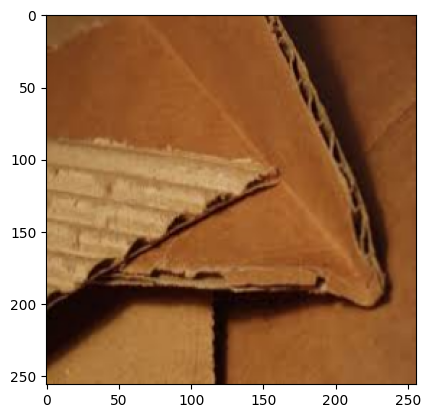

[1 0 0 4 1 5 2 2 4 4 5 4 2 1 1 2 5 4 2 2 2 1 1 5 1 4 1 1 4 1 5 5]


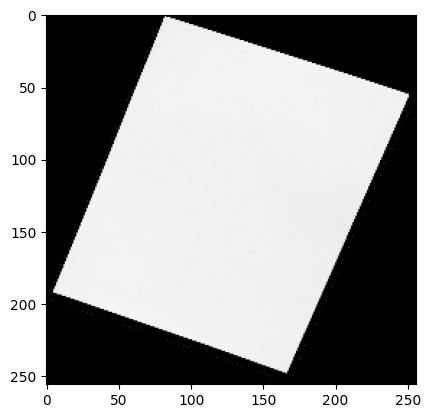

[4 0 1 2 3 3 3 1 1 1 2 5 2 3 4 3 1 1 5 4 5 1 1 1 5 3 5 1 4 0 2 1]


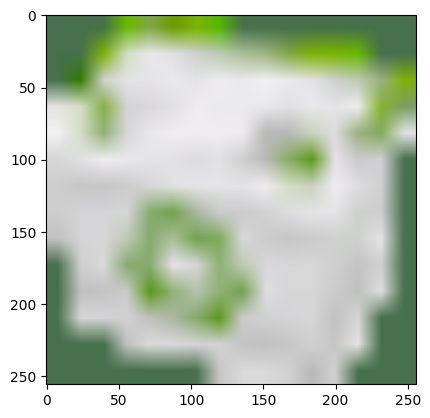

[0 1 1 0 4 5 3 4 2 5 4 1 4 5 0 0 5 5 2 1 1 1 3 1 3 5 5 1 2 1 3 2]


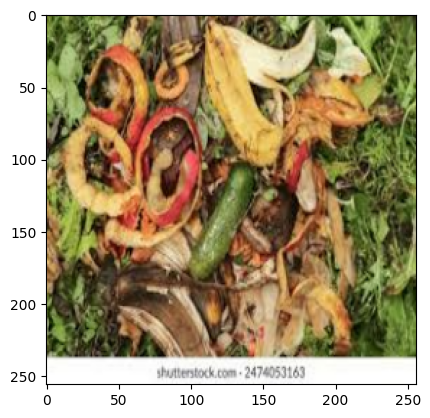

[2 1 1 4 5 1 1 1 1 1 2 4 0 0 3 0 0 1 3 5 3 2 2 5 2 5 4 1 3 1 2 2]


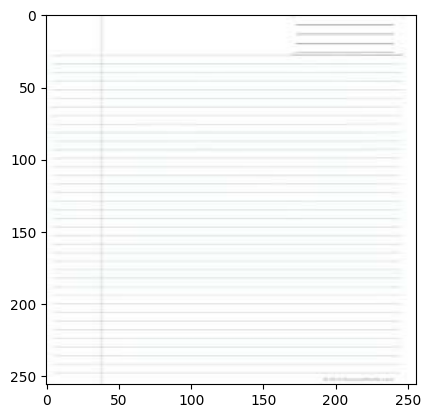

[4 0 1 4 5 1 0 0 3 2 1 3 2 3 5 0 4 0 1 4 5 4 5 4 5 4 5 0 5 3 5 5]


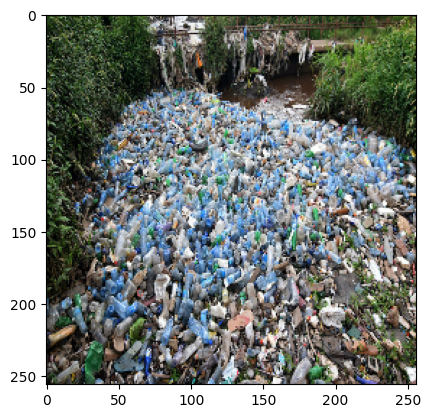

[5 5 0 1 5 3 2 3 1 4 5 0 1 1 5 2 4 5 5 5 1 3 1 1 5 5 1 2 0 4 5 1]


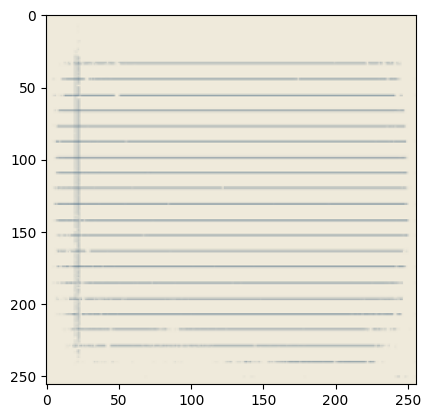

[4 3 1 3 4 1 2 0 3 1 1 1 4 1 5 5 3 2 5 5 0 1 1 5 1 4 1 2 0 1 1 5]


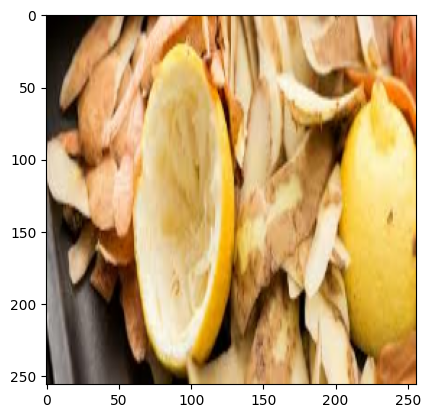

[2 2 3 2 1 1 1 4 1 3 4 1 0 1 3 1 1 2 2 1 1 5 3 1 0 4 1 4 5 1 1 4]


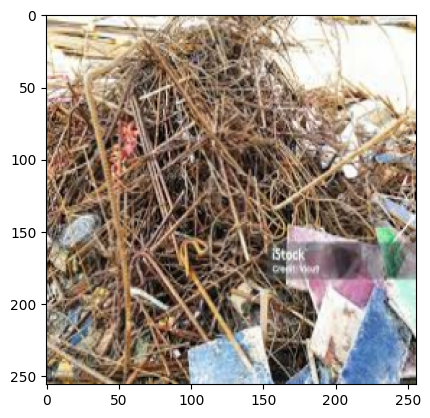

[3 4 2 0 5 2 1 0 5 1 5 5 4 4 2 2 0 2 2 3 1 2 5 3 4 4 1 4 2 1 2 1]


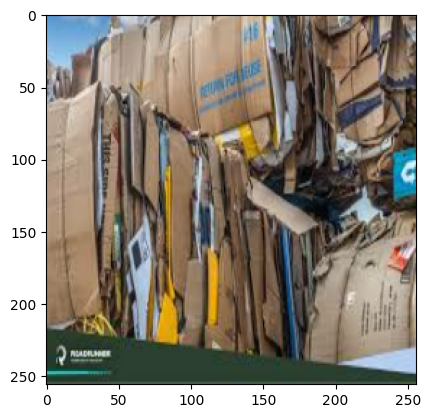

[1 4 0 5 1 1 3 2 1 0 1 2 1 4 3 1 1 1 5 4 0 1 3 3 3 5 1 0 3 0 2 4]


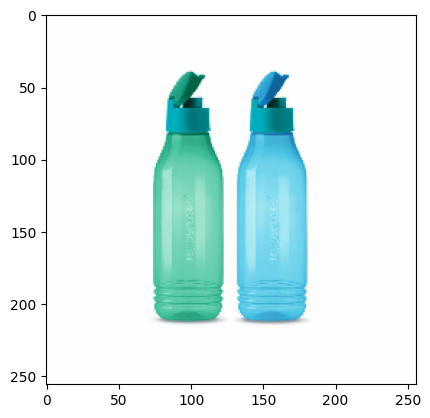

[5 0 5 5 5 0 3 0 1 3 5 3 3 5 3 1 5 5 4 4 4 4 1 4 4 5 3 5 5 5 5 2]


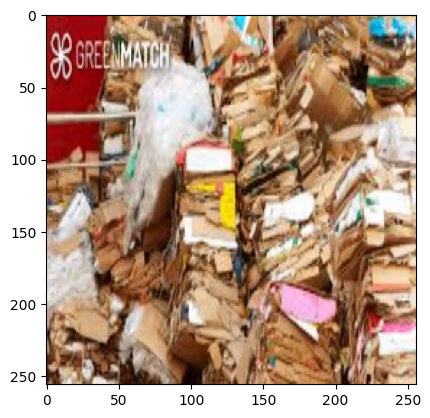

[1 1 1 3 0 1 1 4 4 1 1 1 3 2 1 3 2 0 2 1 0 0 5 4 4 5 1 4 4 1 1 4]


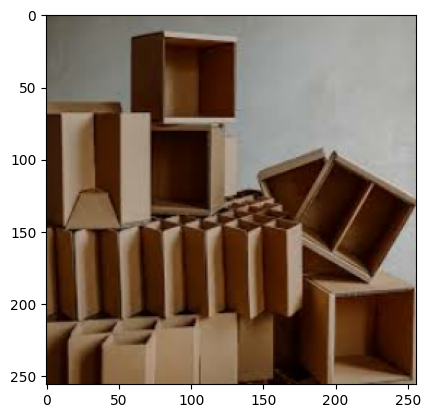

[1 4 4 4 3 0 2 3 5 4 3 1 0 1 1 4 1 0 1 5 4 3 2 0 3 5 2 5 5 5 2 3]


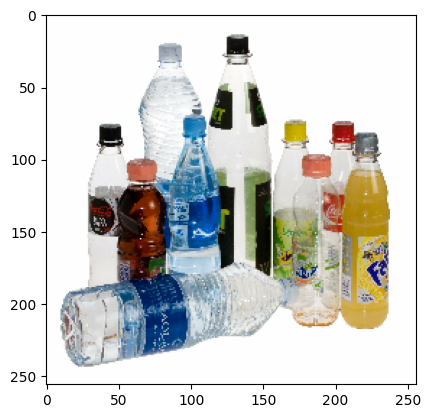

[5 1 0 5 5 1 5 3 1 4 5 4 1 1 1 2 1 1 1 4 2 5 4 0 1 1 4 0 1 3 2 5]


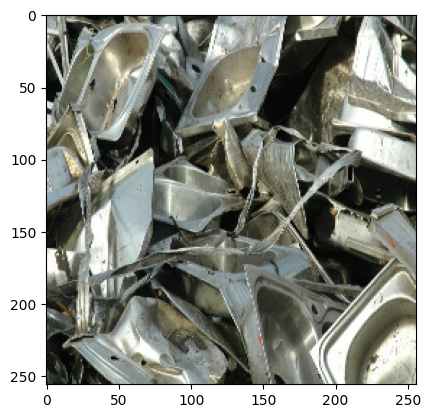

[3 1 5 2 2 3 1 4 3 5 3 3 2 1 1 5 1 5 4 1 5 5 5 1 4 2 0 3 5 1 2 5]


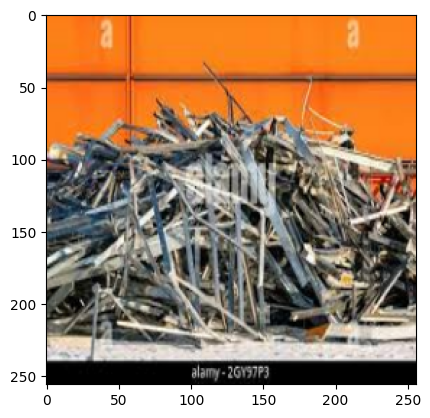

[3 4 5 2 5 1 5 2 5 2 3 5 2 1 4 4 2 1 5 4 1 4 3 5 3 1 5 3 1 0 4 3]


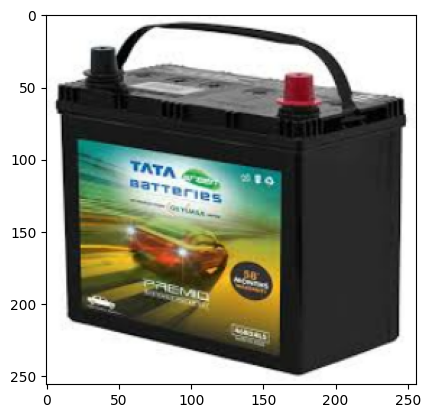

[0 0 2 5 3 1 4 2 1 1 2 1 0 1 5 5 3 5 1 2 1 3 1 1 1 1 5 2 2 0 2 2]


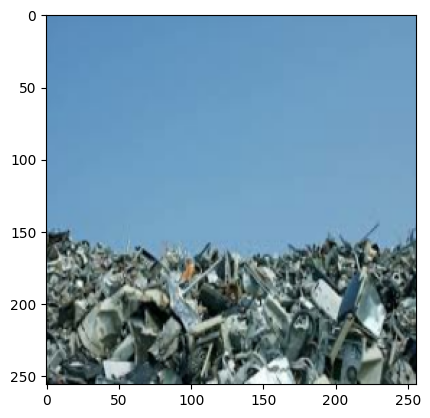

[3 5 1 1 2 1 1 3 1 1 1 2 0 3 4 1 4 4 4 1 2 3 1 4 3 1 0 0 2 1 1 0]


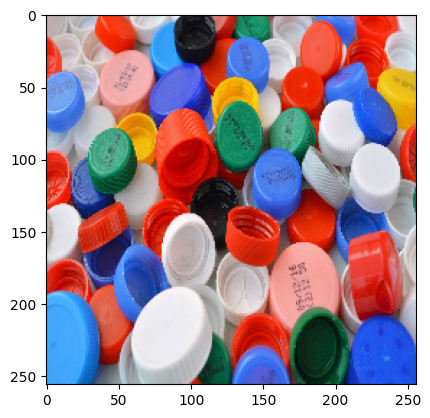

[5 5 0 2 1 2 4 2 3 4 0 3 0 5 5 2 1 1 3 5 2 1 0 5 0 0 1 0 4 3 0 1]


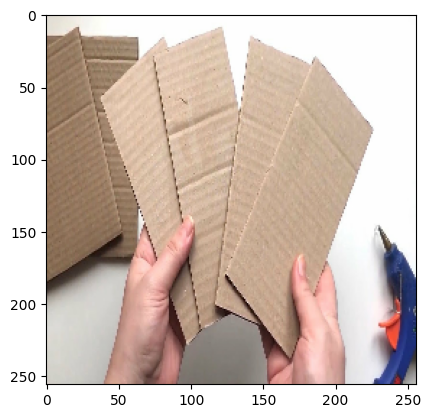

[1 4 5 3 0 1 1 3 1 5 5 1 1 5 4 2 1 5 0 1 4 0 2 3 3 5 5 1 5 5 1 5]


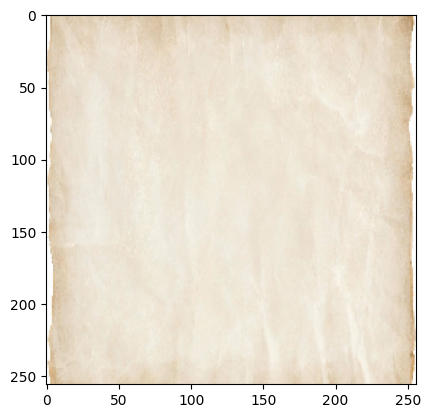

[4 1 1 1 2 1 1 0 1 1 3 1 5 5 1 2 1 5 2 3 1 1 3 5 1 2 4 2 4 1 5 1]


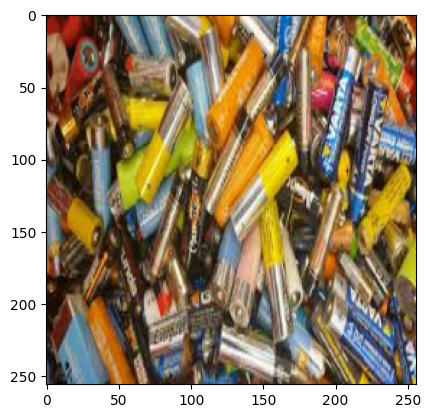

[0 1 1 0 0 0 4 1 2 1 5 4 3 5 0 0 1 0 3 4 1 0 0 4 5 4 3 3 1 4 5 2]


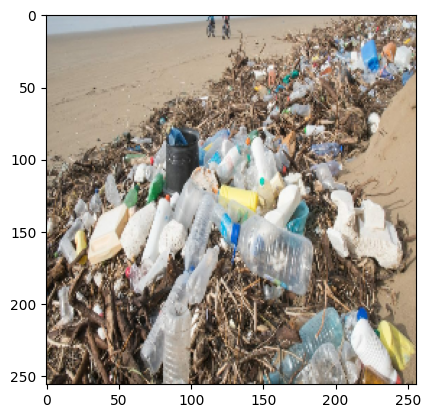

[5 0 4 1 3 5 1 1 1 3 5 4 3 5 3 5 3 1 5 3 4 1 5 4 2 4 4 2 0 1 3 1]


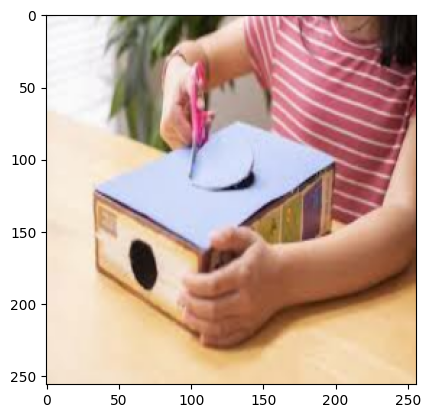

[1 0 3 4 5 3 5 3 5 0 4 5 3 3 1 3 0 5 0 2 3 5 1 5 1 1 1 1 2 1 1 0]


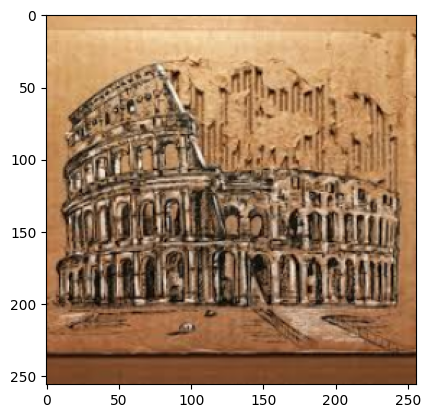

[1 3 1 0 1 1 4 4 1 5 5 2 0 2 1 3 3 5 0 0 3 4 4 0 2 0 5 4 5 2 3 4]


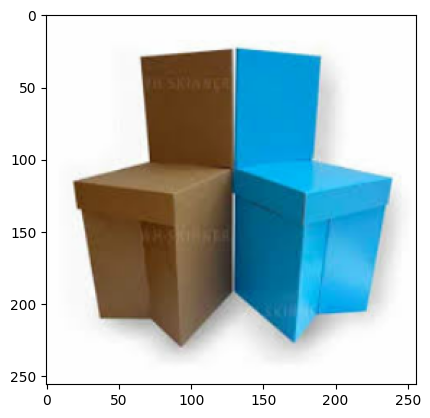

[1 2 1 5 1 1 5 2 3 3 4 5 5 5 1 5 3 4 1 0 5 4 5 2 3 1 5 0 0 1 0 1]


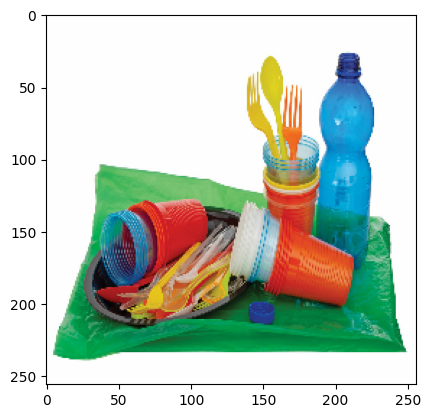

[5 1 5 1 1 0 1 1 0 5 3 0 1 1 3 5 1 5 4 5 1 1 1 1 1 2 5 5 1 1 1 0]


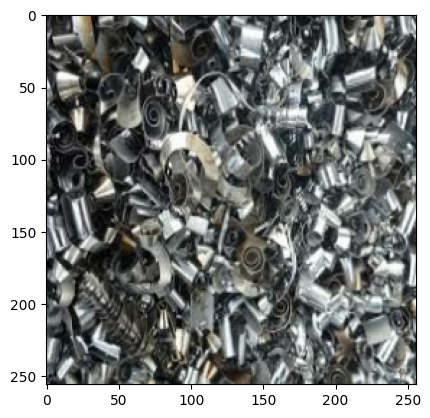

[3 5 1 1 1 5 4 1 5 5 5 0 0 4 3 1 1 1 4 1 1 3 5 3 5 5 5 4 5 1 5 5]


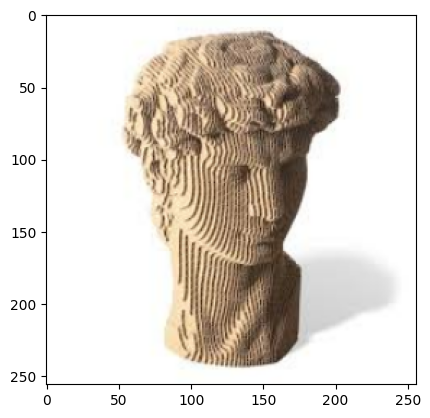

[1 3 3 0 4 3 1 1 1 5 5 1 4 2 3 2 3 3 1 1 5 1 1 0 4 5 5 5 0 1 2 2]


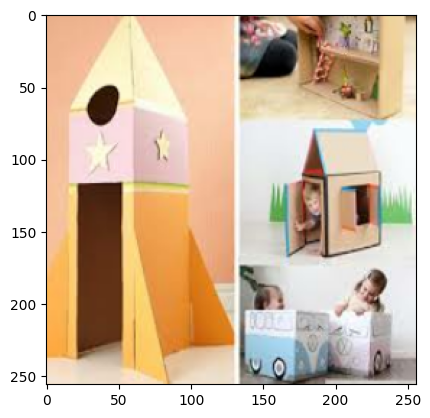

[1 5 1 5 3 5 3 5 5 1 4 1 5 2 2 1 1 2 0 5 5 4 1 5 4 2 3 5 1 5 1 1]


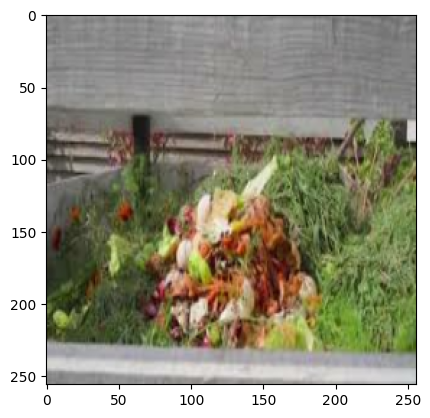

[2 3 3 1 4 4 5 5 2 2 1 3 5 2 1 2 0 4 4 3 3 1 3 3 3 1 2 1 0 0 5 5]


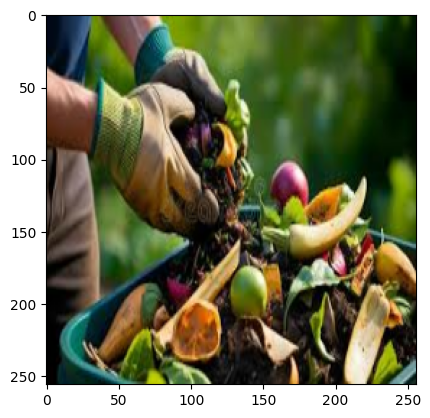

[2 2 2 3 1 1 1 5 1 1 5 1 3 1 5 2]


In [ ]:
i=0
for images, labels in data_i:
    for img in images:
        plt.imshow(img.astype("uint8"))
        plt.show()
        i+=1
        if i>3:
          break
    print(labels)

**Understanding the structure and characteristics of a TensorFlow Dataset**

In [ ]:
##Insted of info() method:-

# Get the element specification of the dataset
element_spec = data.element_spec

# Print the element specification
print("Element Specification:", element_spec)

# Take a few elements from the dataset to inspect data types and shapes
for images, labels in data.take(1):
    print("Image Shape:", images.shape)
    print("Labels Shape:", labels.shape)
    print("Image Data Type:", images.dtype)
    print("Labels Data Type:", labels.dtype)
    # Optionally, print unique labels or other relevant information
    print("Unique Labels:", np.unique(labels.numpy()))

# You can also use Python's built-in functions to get more information:
# - len(list(data)) will give you the total number of batches in the dataset (if cardinality is known).
# - for images, labels in data: ... can be used to iterate through the dataset and gather information.

Element Specification: (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))
Image Shape: (32, 256, 256, 3)
Labels Shape: (32,)
Image Data Type: <dtype: 'float32'>
Labels Data Type: <dtype: 'int32'>
Unique Labels: [0 1 2 3 4 5]


In [ ]:
data.element_spec

(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None,), dtype=tf.int32, name=None))

**Calculate dataset size and split ratios**

In [ ]:
dataset_size = len(data)
train_size = int(0.8 * dataset_size)
test_size = dataset_size - train_size

print(dataset_size,train_size,test_size)

35 28 7


**Splitting the Dataset**

In [ ]:
train_data = data.take(train_size)
test_data = data.skip(train_size)

print(f"Training set size: {len(train_data)} batches")
print(f"Testing set size: {len(test_data)} batches")

Training set size: 28 batches
Testing set size: 7 batches


**Convertig Training Data into X-train and Y_train**

In [ ]:
X_train = []
Y_train = []

for images, labels in train_data:
    X_train.extend(images.numpy())
    Y_train.extend(labels.numpy())

# Convert lists to NumPy arrays
X_train = np.array(X_train)
Y_train = np.array(Y_train)

print(f"X_train shape: {X_train.shape}")
print(f"Y_train shape: {Y_train.shape}")

X_train shape: (896, 256, 256, 3)
Y_train shape: (896,)


**Convertig Testing Data into X-test and Y_test**

In [ ]:
X_test = []
Y_test = []

for images, labels in test_data:
    X_test.extend(images.numpy())
    Y_test.extend(labels.numpy())

# Convert lists to NumPy arrays
X_test = np.array(X_test)
Y_test = np.array(Y_test)

print(f"X_test shape: {X_test.shape}")
print(f"Y_test shape: {Y_test.shape}")

X_test shape: (208, 256, 256, 3)
Y_test shape: (208,)


In [ ]:
Y_train[:6]

#for normalization


array([2, 3, 4, 1, 1, 0], dtype=int32)

**Defining Classes Items to be classified in**

In [ ]:
classes=['Battery','Cardboard','Food', 'Metal' ,'Paper', 'Plastic']  #['Battery','Cardboard','Food','Metal','Paper','Plastic']
classes[1]

#['Plastic', 'Cardboard', 'Paper']

'Cardboard'

**visualizing Sample from Dataset**

In [ ]:
def plot_sample(X,y,index):
  #plt.figure(figsize=(15,2))
  # astype to convert X[index] i.e. image as pixcel as int
  plt.imshow(X[index].astype(int))
  plt.xlabel(classes[y[index]])


'Paper'

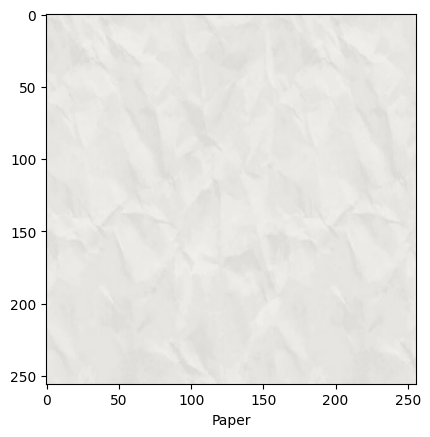

In [ ]:
plot_sample(X_train,Y_train,2)
X_train[0].shape

classes[Y_train[2]]

# **ANN (Artificial Neural Network) Model**
ANNs work by learning patterns in data through iterative adjustments, enabling them to make predictions or classifications.
ANNs often lead to lower accuracy for image-related tasks due to their lack of spatial understanding and increased chances of overfitting.
ANNs treat input data as 1-dimensional, ignoring spatial correlations, leading to suboptimal performance for image data.


Steps / process of ANN :
1. **Inputs**:
   - It starts with an input layer where data (features) is fed into the network, represented as numbers.

2. **Weights & Biases**:
   - Each connection between neurons (nodes) has a **weight** that determines the importance of the input.
   - A **bias** adjusts the output slightly, adding flexibility.

3. **Hidden Layers**:
   - The input passes through **hidden layers**, where weighted inputs are summed, and an **activation function** (e.g., ReLU, sigmoid) is applied to introduce non-linearity.

4. **Forward Propagation**:
   - Data flows through the network layer by layer, generating predictions in the output layer.

5. **Loss Calculation**:
   - The difference between predicted and actual values is calculated using a **loss function** (e.g., Mean Squared Error or Cross-Entropy).

6. **Backpropagation**:
   - The network adjusts weights and biases to minimize loss by propagating the error backward using **gradients**.

7. **Training**:
   - This process is repeated across multiple iterations (epochs), improving the network's ability to predict accurately.

In [ ]:
ann = models.Sequential([
    # Flatten is the first layer which accepts shape of 32X32X3
    #(300, 300, 3) - height, width, and color channels
    layers.Flatten(input_shape=(256,256,3)),
    # next we have 2 Deep layers 1st having 3000 nurons and another(2nd) having 1000 nuerons
    layers.Dense(3000,activation='relu'),
    layers.Dense(1000,activation='relu'),
    # last one having 10 as we have 10 categories
    layers.Dense(6,activation='sigmoid')
])

ann.compile(optimizer='SGD',
            loss="sparse_categorical_crossentropy",
            metrics=['accuracy'])

ann.fit(X_train,Y_train,epochs=5)

Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 106s 4s/step - accuracy: 0.1668 - loss: nan
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 113s 4s/step - accuracy: 0.0934 - loss: nan
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 131s 4s/step - accuracy: 0.0890 - loss: nan
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 147s 4s/step - accuracy: 0.0859 - loss: nan
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 103s 4s/step - accuracy: 0.0904 - loss: nan


In [ ]:
ann.evaluate(X_test,Y_test)

7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 940ms/step - accuracy: 0.1738 - loss: nan


[nan, 0.13461539149284363]

In [ ]:
y_pred = ann.predict(X_test)
y_pred_classes = [np.argmax(element) for element in y_pred]

#gives up classification report
print("Classification Report: \n", classification_report(Y_test, y_pred_classes))

7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step
Classification Report: 
               precision    recall  f1-score   support

           0       0.13      1.00      0.24        28
           1       0.00      0.00      0.00        61
           2       0.00      0.00      0.00        25
           3       0.00      0.00      0.00        25
           4       0.00      0.00      0.00        22
           5       0.00      0.00      0.00        47

    accuracy                           0.13       208
   macro avg       0.02      0.17      0.04       208
weighted avg       0.02      0.13      0.03       208



**Why Choose CNN ?**

Reasons:

1. **Current Model Underperformance**:
   - The report shows poor performance (e.g., precision and recall are 0 for most classes, and overall accuracy is just 13%). This suggests the current model, likely an ANN, is unable to distinguish between classes effectively.

2. **Feature Extraction Issues**:
   - ANNs treat input data (like images) as flat vectors, losing spatial and hierarchical features essential for accurate classification. CNNs, however, extract spatial patterns like edges, textures, and shapes using convolutional filters.

3. **High Dimensional Data**:
   - Image data is inherently high-dimensional, and ANNs struggle with such data due to large parameter requirements. CNNs reduce computational complexity by sharing weights in convolutional layers.

4. **Class Imbalance**:
   - The report highlights class imbalance (e.g., Class 0 dominates with recall = 1.0, while others are 0). CNNs, by focusing on localized patterns, often handle imbalance better than ANNs, which may overfit to dominant classes.

5. **Improved Generalization**:
   - CNNs generalize better for complex, multi-class classification tasks like this. By learning localized features, CNNs can reduce misclassification.

Switching to a CNN can leverage its strengths to improve accuracy, precision, and recall across all classes in this scenario.

#**CNN(Convolutional Neural Network) Model**
CNN as a sequential stack of layers, where each layer's output is fed as input to the next layer.

This snippet outlines the structure and compilation of a **Convolutional Neural Network (CNN)** for a classification task. Here's a breakdown:

**CNN Model Explanation**

**1. Sequential Model**
- `models.Sequential`: Defines the CNN as a sequential stack of layers, where each layer's output is fed as input to the next layer.

**2. Layers in the Model**<br>
**Convolutional Layers:**
- **Conv2D (1st Layer)**:
  - `filters=32`: Learns 32 different features (like edges, patterns).
  - `kernel_size=(3,3)`: Specifies the size of the 2D filter (3x3 pixels).
  - `activation="relu"`: Applies the ReLU function to introduce non-linearity and remove negative values.
  - `input_shape=(256,256,3)`: Input images are 256x256 pixels with 3 color channels (RGB).

- **MaxPooling2D (1st Pooling)**:
  - `(2,2)`: Reduces the spatial dimensions of the feature map by half, keeping the most important information.

- **Conv2D (2nd Layer)**:
  - Another convolutional layer with the same configurations as the first, to detect deeper features.

- **MaxPooling2D (2nd Pooling)**:
  - Further reduces the feature map's size.

**Flatten Layer :**
- `layers.Flatten()`: Flattens the 2D feature maps into a 1D vector, preparing the data for fully connected dense layers.

**Dense (Fully Connected) Layers :**
- **1st Dense Layer**:
  - `Dense(64, activation='relu')`: Adds a dense layer with 64 neurons to process the extracted features.
- **2nd Dense Layer**:
  - Another dense layer with 64 neurons and ReLU activation.
- **Output Dense Layer**:
  - `Dense(6, activation='sigmoid')`:
    - Output layer with 6 neurons (for 6 classes).
    - **Sigmoid Activation**: Outputs probabilities for each class, suitable for multi-label classification. For a multi-class problem, **softmax** might be preferred.

**3. Model Compilation**
- `optimizer="adam"`: Uses the Adam optimizer, which is efficient for most tasks as it adapts the learning rate during training.
- `loss="sparse_categorical_crossentropy"`: Suitable for multi-class classification when labels are integers (not one-hot encoded).
- `metrics=['accuracy']`: Tracks accuracy during training and evaluation.



In [ ]:
cnn = models.Sequential([
    #CNN
    #filters=32 will discover 32 different features or edges in the image
    #kernel_size=(3,3) the actual filter size is specified here
    layers.Conv2D(filters=32,kernel_size=(3,3),activation="relu",input_shape=(256,256,3)),
    #
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(filters=32,kernel_size=(3,3),activation="relu"),
    #
    layers.MaxPooling2D((2,2)),

    #LAYERS
    #in the middel layer we dont need to specify the reshape the network will figure it out automatically
    layers.Flatten(),
    # we are gooing to keep only 1 layer as CNN will do most of the work so we dont need so many neurons or layers
    layers.Dense(64,activation='relu'),
    layers.Dense(64,activation='relu'),
    # last one having 10 as we have 10 categories
    # activation ="softmax" as its popular & the difference betn sigmoid VS softmax is that softmax will normalize the probablity
    layers.Dense(6,activation='sigmoid')
])

cnn.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=['accuracy'])

In [ ]:
cnn.fit(X_train,Y_train,epochs=10)

Epoch 1/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 72s 2s/step - accuracy: 0.1826 - loss: 694.4382
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - accuracy: 0.4777 - loss: 1.6070
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 74s 2s/step - accuracy: 0.6858 - loss: 1.0110
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 68s 2s/step - accuracy: 0.8359 - loss: 0.5244
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.8679 - loss: 0.3852
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.9181 - loss: 0.2675
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.9097 - loss: 0.2436
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.9476 - loss: 0.1445
Epoch 9/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.9654 - loss: 0.1892
Epoch 10/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 76s 3s/step - accuracy: 0.9554 - loss: 0.2233


In [ ]:
cnn.evaluate(X_test,Y_test)

7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 617ms/step - accuracy: 0.7583 - loss: 2.6551


[2.237424373626709, 0.7788461446762085]

In [ ]:
y_pred = cnn.predict(X_test)
y_pred_classes = [np.argmax(element) for element in y_pred]

#gives up classification report
print("Classification Report: \n", classification_report(Y_test, y_pred_classes))

7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 670ms/step
Classification Report: 
               precision    recall  f1-score   support

           0       0.84      0.57      0.68        28
           1       0.80      0.93      0.86        61
           2       0.65      0.68      0.67        25
           3       0.80      0.80      0.80        25
           4       0.68      0.86      0.76        22
           5       0.87      0.72      0.79        47

    accuracy                           0.78       208
   macro avg       0.77      0.76      0.76       208
weighted avg       0.79      0.78      0.78       208



In [ ]:
y_pred=cnn.predict(X_test)

7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 661ms/step


In [ ]:
accu=accuracy_score(Y_test,y_pred_classes)
accu

0.7836538461538461

In [ ]:
# Assuming cnn is your compiled model
hist = cnn.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=10, batch_size=32)

Epoch 1/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 74s 3s/step - accuracy: 0.9616 - loss: 0.1912 - val_accuracy: 0.7260 - val_loss: 2.1768
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.9503 - loss: 0.2297 - val_accuracy: 0.7692 - val_loss: 1.4302
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 87s 3s/step - accuracy: 0.9849 - loss: 0.1060 - val_accuracy: 0.7452 - val_loss: 2.5995
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.9788 - loss: 0.1248 - val_accuracy: 0.7596 - val_loss: 1.6918
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 75s 3s/step - accuracy: 0.9707 - loss: 0.1034 - val_accuracy: 0.7596 - val_loss: 1.4271
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.9821 - loss: 0.1034 - val_accuracy: 0.7740 - val_loss: 2.0137
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 74s 3s/step - accuracy: 0.9845 - loss: 0.0675 - val_accuracy: 0.7692 - val_loss: 1.6671
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.9853 - loss: 0.0648 - val_accuracy: 0.7500 - val_loss:

**Loss**

This line chart visualizes the **loss values** for both training and validation (or testing) data over multiple epochs:

- The **x-axis** represents the number of epochs (from 0 to 9 in this case), which corresponds to the number of training cycles the model underwent.
- The **y-axis** represents the **loss values**, with lower values generally indicating better model performance.

Explanation :
1. **Teal Line (`loss`)**:  
   This line represents the **training data loss**, showing how well the model performed on the training dataset during each epoch. In this chart, the training loss remains consistently very low, close to **0.0**, which suggests that the model fits the training data very well.

2. **Orange Line (`val_loss`)**:  
   This line represents the **validation data loss**, reflecting the model's performance on unseen data (the validation/test set). The validation loss shows fluctuations, starting at around **2.0**, peaking at **3.0**, and eventually settling back near **2.0**. This variability can indicate possible issues like **overfitting**, where the model learns the training data too well but struggles to generalize to new data.

### Overall Interpretation:
- The **low, stable training loss** shows that the model is effectively learning the patterns in the training data.
- The **higher and fluctuating validation loss** suggests that the model's ability to generalize to unseen data is limited and may need improvement, such as through regularization, more data, or tuning hyperparameters.

Would you like help diagnosing this behavior or optimizing the model further?

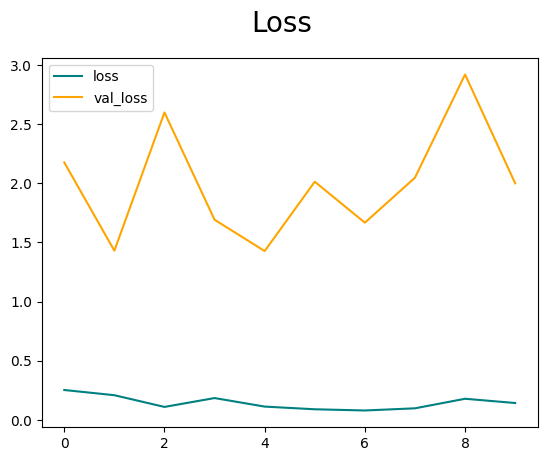

In [ ]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

**Accuracy**

This line chart visualizes the **accuracy values** for both training and validation data over multiple epochs:

- The **x-axis** represents the number of epochs, which corresponds to the number of training cycles the model underwent.
- The **y-axis** represents the **accuracy values**, with higher values generally indicating better model performance.

Explanation :
1. **Teal Line (`accuracy`)**:  
   This line represents the **training data accuracy**, showing how well the model performed on the training dataset during each epoch. In this chart, it reflects the model's ability to learn patterns from the training data, with values expected to improve as epochs increase.

2. **Orange Line (`val_accuracy`)**:  
   This line represents the **validation data accuracy**, showing how well the model generalizes to unseen data. It helps detect issues like overfitting (if validation accuracy stagnates or worsens while training accuracy increases).


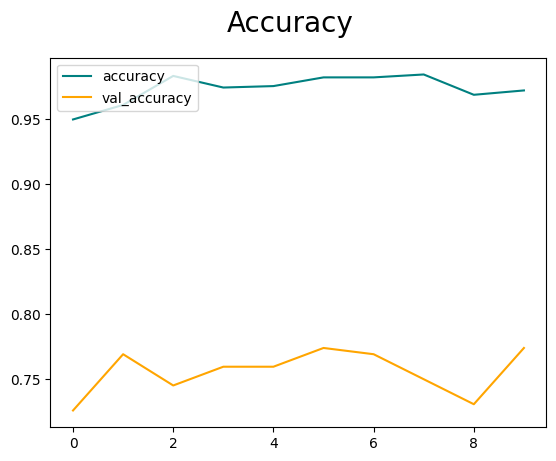

In [ ]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

In [ ]:
y_class=[np.argmax(ele) for ele in y_pred]
y_class[:6]

[np.int64(1), np.int64(3), np.int64(1), np.int64(0), np.int64(5), np.int64(3)]

In [ ]:
Y_test[:6]

array([5, 2, 1, 0, 5, 3], dtype=int32)

# **Checking the Accuracy / Predicting The Waste**

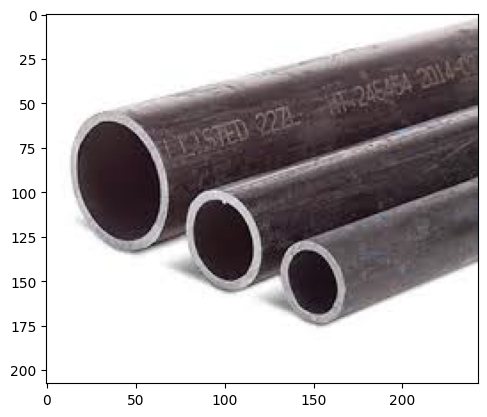

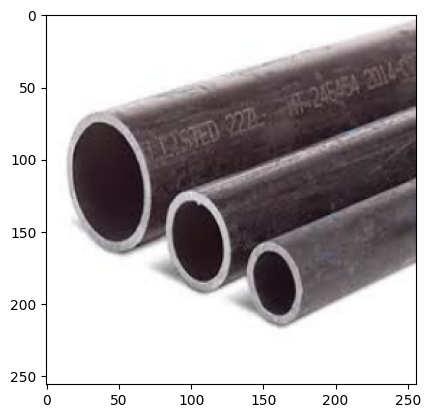

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
3
Metal


In [ ]:
img = cv2.imread('/content/image (14).jpeg')
plt.imshow(img)
plt.show()
# %%
# Resize the image to the expected input shape of the CNN model (32, 32, 3)
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()
# %%
y_pred=cnn.predict(np.expand_dims(resize.numpy().astype(int),axis=0)) # Add a batch dimension to the image
y_class=[np.argmax(ele) for ele in y_pred]
print(y_class[0])
print(classes[y_class[0]])

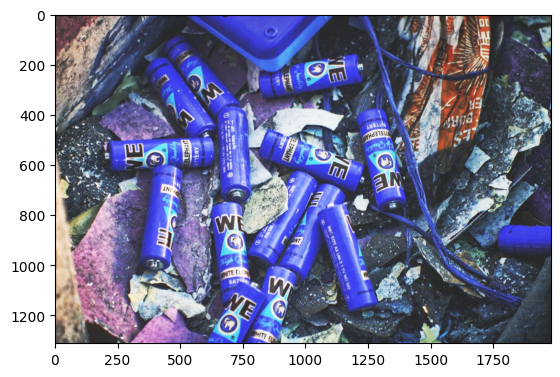

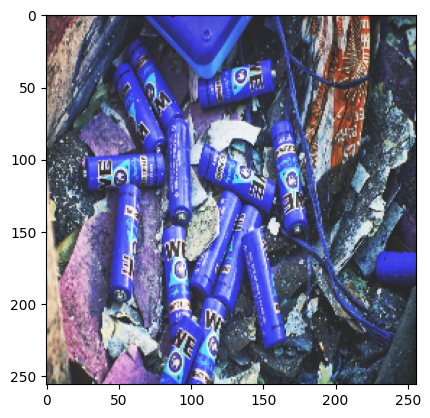

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
0
Battery


In [ ]:
img = cv2.imread('/content/Batteries2.jpg')
plt.imshow(img)
plt.show()
# %%
# Resize the image to the expected input shape of the CNN model (32, 32, 3)
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()
# %%
y_pred=cnn.predict(np.expand_dims(resize.numpy().astype(int),axis=0)) # Add a batch dimension to the image
y_class=[np.argmax(ele) for ele in y_pred]
print(y_class[0])
print(classes[y_class[0]])

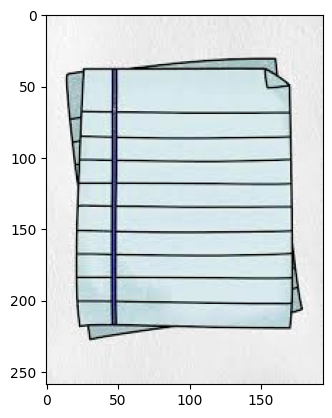

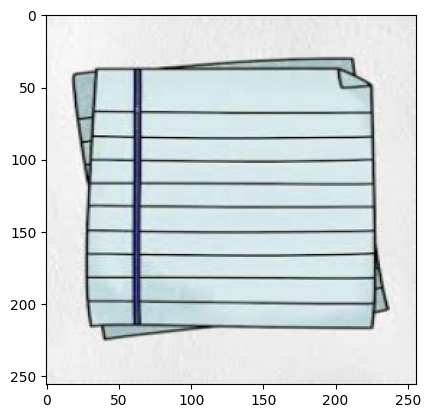

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1
Cardboard


In [ ]:
img = cv2.imread('/content/image (20).jpeg')
plt.imshow(img)
plt.show()
# %%
# Resize the image to the expected input shape of the CNN model (32, 32, 3)
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()
# %%
y_pred=cnn.predict(np.expand_dims(resize.numpy().astype(int),axis=0)) # Add a batch dimension to the image
y_class=[np.argmax(ele) for ele in y_pred]
print(y_class[0])
print(classes[y_class[0]])

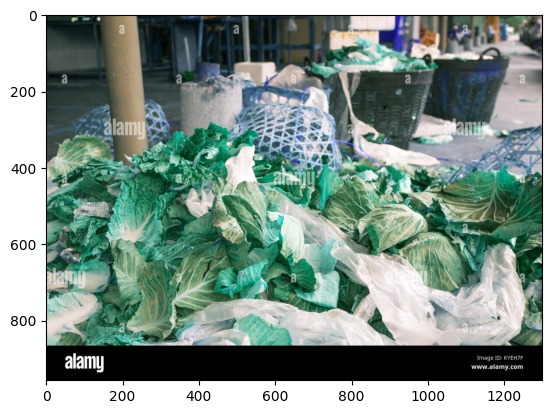

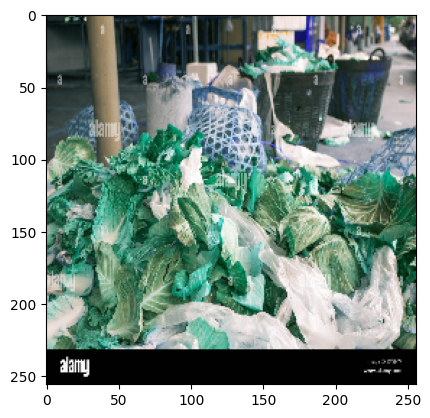

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
2
Food


In [ ]:
img = cv2.imread('/content/dump-of-vegetable-waste-in-the-fresh-market-KYEH7F.jpg')
plt.imshow(img)
plt.show()
# %%
# Resize the image to the expected input shape of the CNN model (32, 32, 3)
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()
# %%
y_pred=cnn.predict(np.expand_dims(resize.numpy().astype(int),axis=0)) # Add a batch dimension to the image
y_class=[np.argmax(ele) for ele in y_pred]
print(y_class[0])
print(classes[y_class[0]])

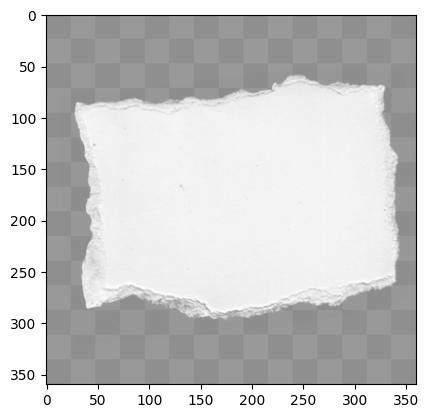

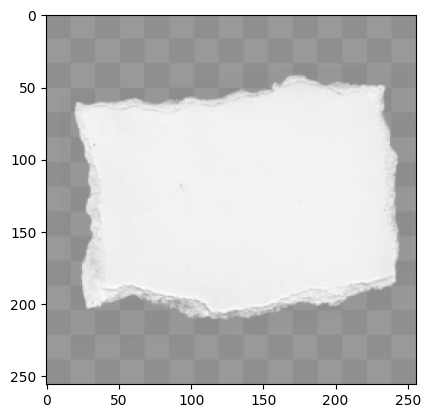

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
4
Paper


In [ ]:
img = cv2.imread('/content/pngtree-stylish-ripped-torn-paper-texture-background-transpa.png')
plt.imshow(img)
plt.show()
# %%
# Resize the image to the expected input shape of the CNN model (32, 32, 3)
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()
# %%
y_pred=cnn.predict(np.expand_dims(resize.numpy().astype(int),axis=0)) # Add a batch dimension to the image
y_class=[np.argmax(ele) for ele in y_pred]
print(y_class[0])
print(classes[y_class[0]])

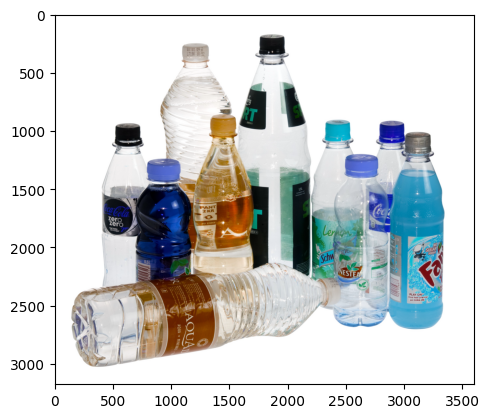

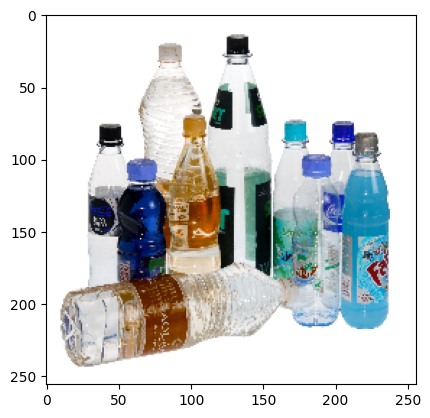

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
5
Plastic


In [ ]:
img = cv2.imread('/content/1_plastic_bottles_3600x.jpg')
plt.imshow(img)
plt.show()
# %%
# Resize the image to the expected input shape of the CNN model (32, 32, 3)
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()
# %%
y_pred=cnn.predict(np.expand_dims(resize.numpy().astype(int),axis=0)) # Add a batch dimension to the image
y_class=[np.argmax(ele) for ele in y_pred]
print(y_class[0])
print(classes[y_class[0]])

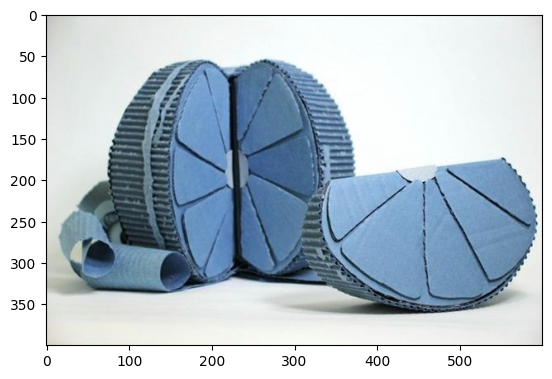

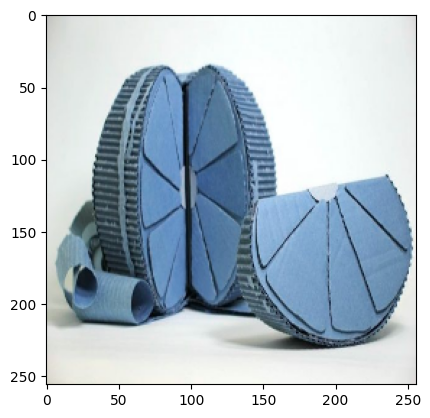

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
5
Plastic


In [ ]:
img = cv2.imread('/content/5b9823487e13289da7c04f0c1ac5eca1.jpg')
plt.imshow(img)
plt.show()
# %%
# Resize the image to the expected input shape of the CNN model (32, 32, 3)
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()
# %%
y_pred=cnn.predict(np.expand_dims(resize.numpy().astype(int),axis=0)) # Add a batch dimension to the image
y_class=[np.argmax(ele) for ele in y_pred]
print(y_class[0])
print(classes[y_class[0]])

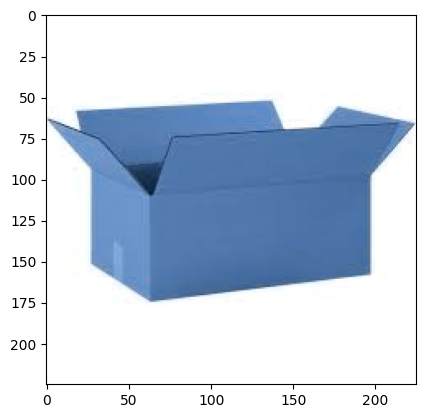

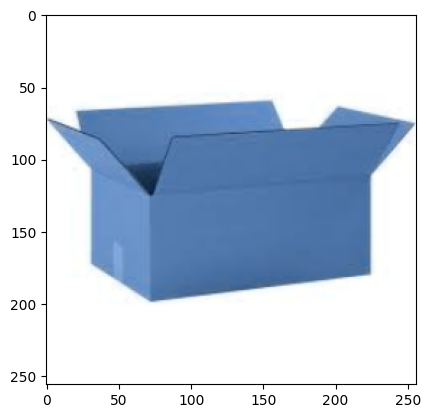

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1
Cardboard


In [ ]:
img = cv2.imread('/content/image (5).jpeg')
plt.imshow(img)
plt.show()
# %%
# Resize the image to the expected input shape of the CNN model (32, 32, 3)
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()
# %%
y_pred=cnn.predict(np.expand_dims(resize.numpy().astype(int),axis=0)) # Add a batch dimension to the image
y_class=[np.argmax(ele) for ele in y_pred]
print(y_class[0])
print(classes[y_class[0]])

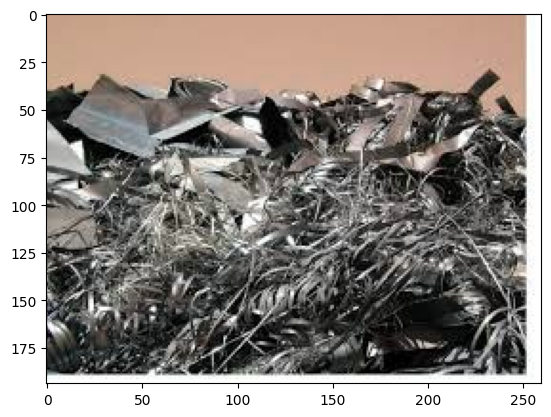

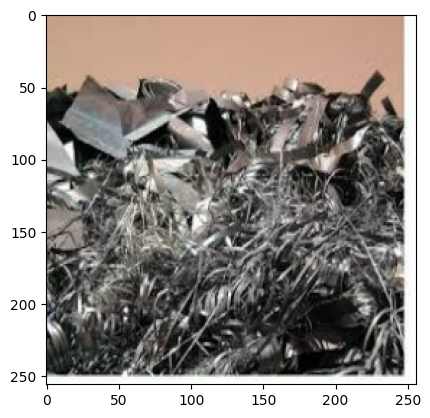

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
3
Metal


In [ ]:
img = cv2.imread('/content/image (9).jpeg')
plt.imshow(img)
plt.show()
# %%
# Resize the image to the expected input shape of the CNN model (32, 32, 3)
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()
# %%
y_pred=cnn.predict(np.expand_dims(resize.numpy().astype(int),axis=0)) # Add a batch dimension to the image
y_class=[np.argmax(ele) for ele in y_pred]
print(y_class[0])
print(classes[y_class[0]])

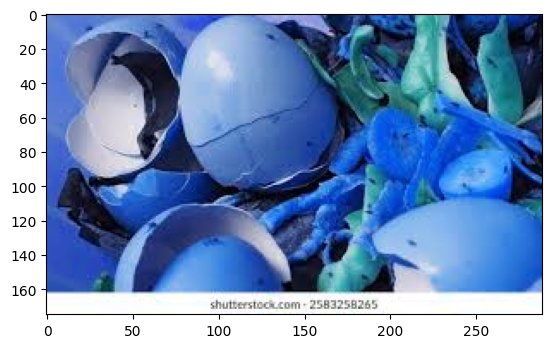

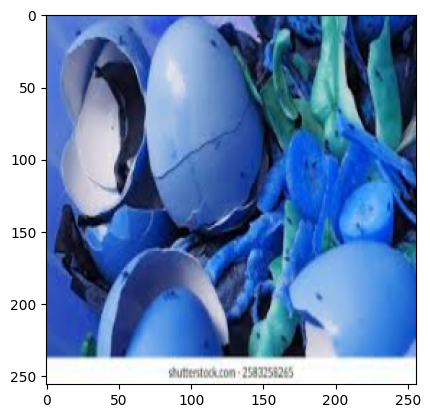

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
5
Plastic


In [ ]:
img = cv2.imread('/content/images (92).jpeg')
plt.imshow(img)
plt.show()
# %%
# Resize the image to the expected input shape of the CNN model (32, 32, 3)
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()
# %%
y_pred=cnn.predict(np.expand_dims(resize.numpy().astype(int),axis=0)) # Add a batch dimension to the image
y_class=[np.argmax(ele) for ele in y_pred]
print(y_class[0])
print(classes[y_class[0]])

In [ ]:
cnn.save('model_newData.h5')

In [ ]:
keras.saving.save_model(cnn, '1_model_newData.keras')

In [ ]:
# prompt: to delete each file in a directory
'''
data_dir = 'NewGarbageDataSet111/Data' # Replace with your directory path

image_exts = ['gif']

for image_class in os.listdir(data_dir):
    for image in os.listdir(os.path.join(data_dir, image_class)):
        image_path = os.path.join(data_dir, image_class, image)
        try:
            img = cv2.imread(image_path)
            tip = imghdr.what(image_path)
            if tip not in image_exts:
                print('Image not in ext list {}'.format(image_path))
                os.remove(image_path)
        except Exception as e:
            print('Issue with image {}'.format(image_path))
            # os.remove(image_path)
'''

Image not in ext list NewGarbageDataSet111/Data/Cardboard/images (13).jpeg
Image not in ext list NewGarbageDataSet111/Data/Cardboard/image (2).jpeg
Image not in ext list NewGarbageDataSet111/Data/Cardboard/images (80).jpeg
Image not in ext list NewGarbageDataSet111/Data/Cardboard/Difference-Between-Virgin-and-Recycled-Cardboard-1080x630.jpg
Image not in ext list NewGarbageDataSet111/Data/Cardboard/images (75).jpeg
Image not in ext list NewGarbageDataSet111/Data/Cardboard/images (39).jpeg
Image not in ext list NewGarbageDataSet111/Data/Cardboard/images (163).jpeg
Image not in ext list NewGarbageDataSet111/Data/Cardboard/images (55).jpeg
Image not in ext list NewGarbageDataSet111/Data/Cardboard/WM-IM-2024-03-22T102852-568.jpg
Image not in ext list NewGarbageDataSet111/Data/Cardboard/images (9).jpeg
Image not in ext list NewGarbageDataSet111/Data/Cardboard/images (7).jpeg
Image not in ext list NewGarbageDataSet111/Data/Cardboard/images (136).jpeg
Image not in ext list NewGarbageDataSet111

**Loss (training loss and validation loss)**
1. **`fig = plt.figure()`**:  
   This creates a new figure object using Matplotlib. A figure is essentially a blank canvas where you can add plots, charts, or other visual elements. You can customize properties of the figure later, such as its size, title, or layout.

2. **`plt.plot(hist.history['loss'], color='teal', label='loss')`**:  
   This generates a line plot for the `loss` values recorded during the training process. The `color='teal'` specifies the color of the line, and `label='loss'` provides a label for the plot. The `hist.history['loss']` refers to the training loss stored in the history object of the model.

3. **`plt.plot(hist.history['val_loss'], color='orange', label='val_loss')`**:  
   Similar to the above, this line plots the validation loss, which is the loss recorded on the validation dataset after each epoch. The line is colored orange, and the label is set to `'val_loss'`.



The resulting plot will show how the training loss and validation loss evolve over epochs, helping you evaluate the performance of your CNN model. Let me know if you want to expand this or troubleshoot further!